## Large Scale Optimization TP3: X-ray tomography

#### Samuel Bazaz Jazayeri

## Reconstruction of DOSY NMR signals - Part1 

In [6]:
############
# Packages #
############
import os
import time as t
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt 
import plotly.express as px
import plotly.io as pio
from scipy import sparse, linalg
from pathlib import Path
from numba import jit
from tqdm import tqdm
from scipy.io import loadmat
from typing import Dict, Union, List, Tuple, Any, Callable, Optional
pio.renderers.default = "plotly_mimetype+notebook"

from sklearn.metrics import mean_squared_error

##########
# global #
##########
N = 90 * 90
M = 90 * 180
np.random.seed(1)

#########
# paths #
#########
root_path = Path(os.getcwd())
data_path = root_path.joinpath("data")
x_path = data_path.joinpath("x.mat")
H_path = data_path.joinpath("H.mat")
G_path = data_path.joinpath("G.mat")

###########
# loading #
###########
x = loadmat(x_path)["x"].squeeze()
H = loadmat(H_path)["H"]
G = loadmat(G_path)["G"]
print(x.shape, H.shape, G.shape)

############
# plotting #
############
def plot_signal(vec, title = "signal"):
    px.line(vec, template = "plotly_dark", title = title).show()
    
def plot_hist(vec, title = "hist"):
    px.histogram(vec, title = title, template = "plotly_dark").show()

def plot_2d(vec, title="sinogram"):
    plt.clf()
    sns.heatmap(vec, cmap="cividis" )
    plt.title(title)
    plt.show()
    
def plot_xbar_T(xb, arr_T, name = "xbar"):
    df = pd.DataFrame({"T":arr_T, "xbar":xb})
    fig = px.line(df, x="T", y="xbar", template = "plotly_dark", title = f"<b>diffusion distribution {name}</b>")
    fig.show()

def plot_estim(xb, true_x, name = "estimate xbar"):
    fig = px.line(xb, template = "plotly_dark", title = f"<b>diffusion distribution {name}</b>")
    fig.add_traces(
    list(px.line(true_x.copy()).select_traces())
    )
    fig.data[0].line.color = "red"
    fig.show()

def plot_nqerror(f_score, arr_beta, name = "smoothness prior"):
    df = pd.DataFrame({"beta":arr_beta, "normalized quadratic error":f_score(arr_beta)})
    best_beta = df.loc[df["normalized quadratic error"].argmin(), "beta"]
    fig = px.line(df, x="beta", y="normalized quadratic error", template = "plotly_dark", title = f"<b>Normalized quadratic error {name}, best beta = {np.round(best_beta, 3)}</b> logscale", log_x=True)
    fig.show()

(8100,) (16200, 8100) (16200, 8100)


## 1 X-ray tomography

Commençons par jeter un coup d'oeil à nos données.

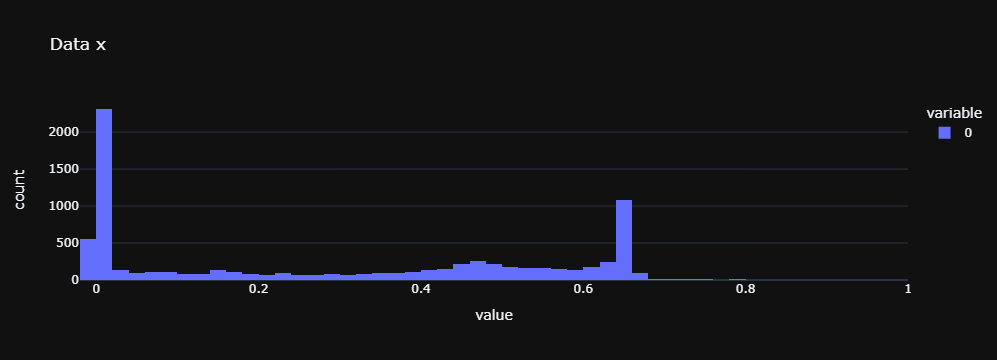

In [3]:
plot_hist(x, "Data x")

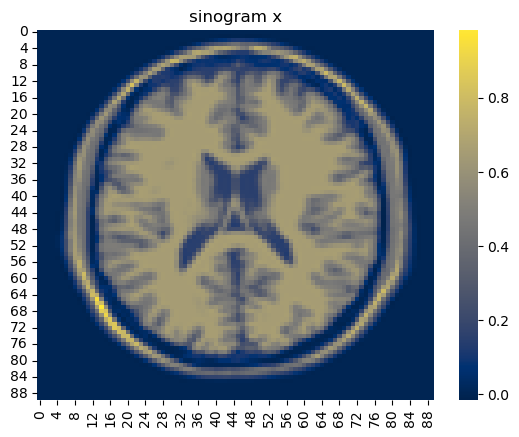

In [4]:
plot_2d(x.reshape((90,90),order="F"), title = "sinogram x")

Maintenant construisons le signal observé à partir d'une transformation linéaire du signal et de l'ajout d'un bruit gaussien.

  0%|          | 0/1000 [00:30<?, ?it/s]


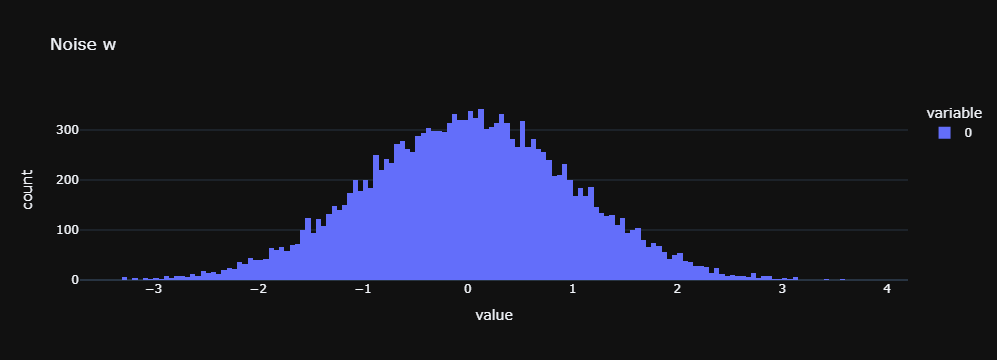

In [13]:
noise = np.random.normal(loc=0.0, scale=1.0, size=M)
plot_hist(noise, "Noise w")

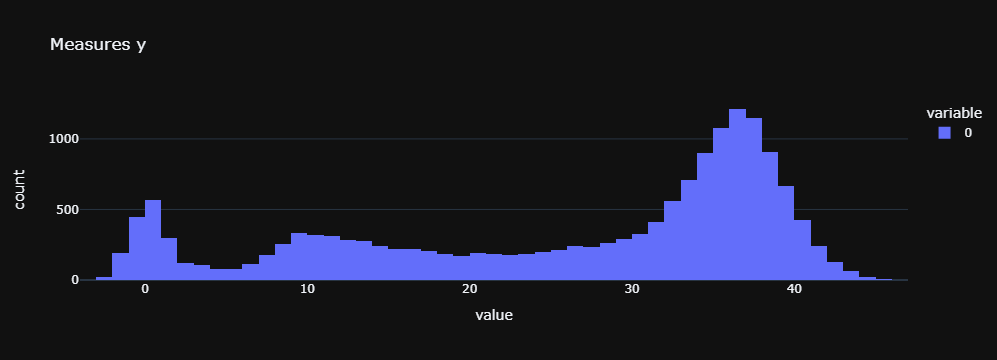

In [14]:
y = H.dot(x) + noise
plot_hist(y, "Measures y")

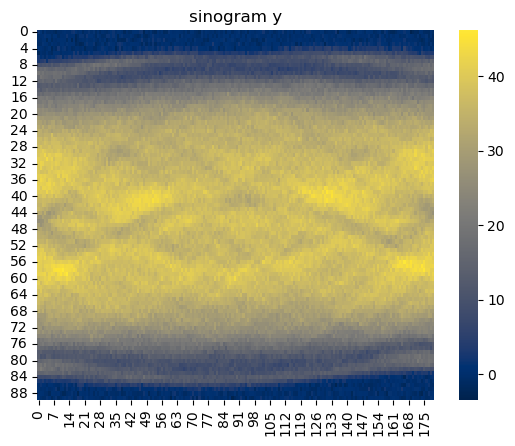

In [7]:
plot_2d(y.reshape((90, 180), order="F"), title = "sinogram y")

Il y a un peu de travaille pour retrouver le signal initial... 

## 2-Optimization problem

In [16]:
def grad_f(x, λ = 0.13, δ = 0.02):
    φp = G@x / (δ * np.sqrt(δ**2 + (G@x)**2 ))
    return H.T@( H@x - y ) + λ * G.T@φp

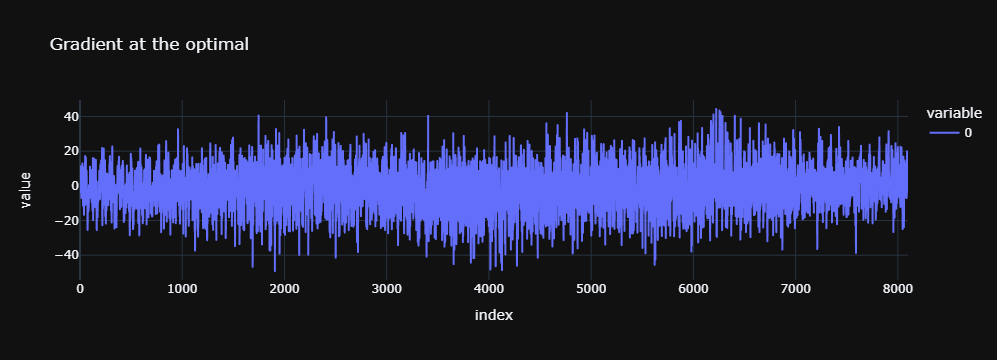

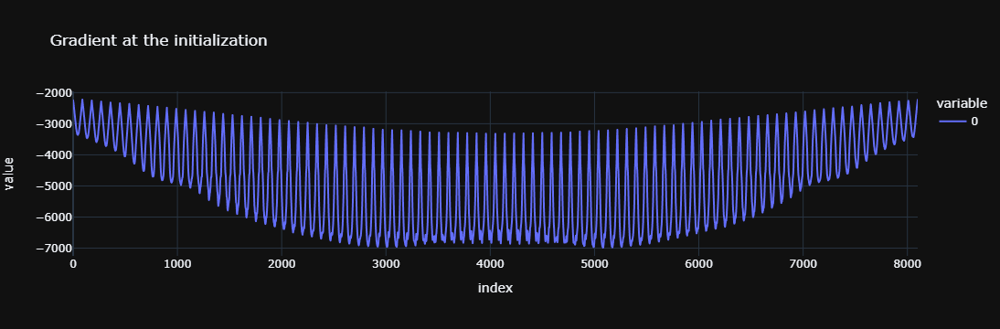

In [117]:
plot_signal(grad_f(x), "Gradient at the optimal")
plot_signal(grad_f(np.zeros_like(x)), "Gradient at the initialization")

Le gradient est non nul à l'optimum en raison du bruit Gaussien, cependant on observe un signal qui s'apparente à un bruit blanc ce qui est bon signe. Aussi on remarque que les variations sont d'une faible amplitude comparé à celui en un signal constant égale à 1.

### Calcul du paramètre L

In [115]:
def get_L(λ = 0.13, δ = 0.02):
    norm_H = np.max(sparse.linalg.svds(H, return_singular_vectors=False))
    norm_G = np.max(sparse.linalg.svds(G, return_singular_vectors=False))
    # Compute Lipschitz constant
    return norm_H ** 2 + λ / (δ**2) * (norm_G**2)
L = get_L()
print(L)

18092.773276864802


## 3-Optimization algorithms

Avant d'implémenter les algorithmes d'optimisation, construisons la fonction objectif afin d'étudier sa décroissance.

In [15]:
def get_f(λ = 0.13, δ = 0.02):
    φ = lambda u : np.sqrt(1 + u**2 / δ ** 2)
    return lambda u : 1 / 2 * np.sum((H@u - y)**2) + λ * np.sum(φ(G@u))

f = get_f()
print(f(np.zeros_like(x)),f(x))

6846769.587861688 14638.974974740353


L'objectif est bien plus faible à l'optimum, jusque ici tout va bien. Définissons maintenant des fonctions standards pour la construction et l'analyse de nos algorithmes. Au vue de la valeur du gradient de f en x, nous allons adapter un peu le critère d'arrêt qui semble un peu trop faible.

In [17]:
def SNR(xn):
    return 10 * np.log10(np.sum(x ** 2) / np.sum((x - xn) ** 2))

def iterator(f_update, tqdm_para = 5):
    xn = np.zeros_like(x)
    xprev = xn.copy()
    objectifs = []
    snr = []
    n=0
    pbar = tqdm(total=1000)
    while np.linalg.norm(grad_f(xn)) > np.sqrt(N)* 4e-1: #stopping criterion
        objectifs.append(f(xn)) 
        snr.append(SNR(xn))
        temp = xn.copy()
        xn = f_update(n,xn, xprev)
        if n>0:
            xprev = temp
            
        if n%tqdm_para==0:
            pbar.update(tqdm_para)
        if n>1000:
            break
        n+=1
        
    return xn, np.array(objectifs), np.array(snr), n

def show_results(f_opti):
    t1 = t.time()
    xn, objectifs, snr, n_iter = f_opti()
    t2 = t.time()
    plot_signal(objectifs, f"<b>Objective function during {f_opti.__name__}</b> n_iter = {n_iter}<br> Total time = {np.round(t2-t1,3)}s")
    plot_signal(snr, f"<b> Signal to Noise Ratio {f_opti.__name__}</b> n_iter = {n_iter}<br> Total time = {np.round(t2-t1,3)}s")
    plot_2d(xn.reshape((90,90),order="F"), title = f"sinogram xn {f_opti.__name__} n_iter = {n_iter} | SNR = {np.round(snr[-1],3)} objectif = {np.round(objectifs[-1],3)}")

En effet le critère d'arrêt proposé semble inacessible:

In [127]:
print(np.sqrt(N) * 1e-4, np.linalg.norm(grad_f(x)))

0.009000000000000001 1107.0562534422531


### Gradient descent

On utilise ici le pas optimal pour les fonctions smooth.

In [141]:
def opti_gd():
    def update(n,xn,xprev):
        return xn - 1 / L * grad_f(xn)
    return iterator(update, tqdm_para = 50)




  0%|          | 0/1000 [00:00<?, ?it/s]


 10%|█         | 100/1000 [00:04<00:41, 21.46it/s]


 15%|█▌        | 150/1000 [00:10<01:01, 13.86it/s]


 20%|██        | 200/1000 [00:14<01:01, 13.03it/s]


 25%|██▌       | 250/1000 [00:18<00:58, 12.72it/s]


 30%|███       | 300/1000 [00:22<00:55, 12.63it/s]


 35%|███▌      | 350/1000 [00:26<00:50, 12.82it/s]


 40%|████      | 400/1000 [00:29<00:45, 13.07it/s]


 45%|████▌     | 450/1000 [00:33<00:42, 13.02it/s]


 50%|█████     | 500/1000 [00:38<00:38, 13.11it/s]


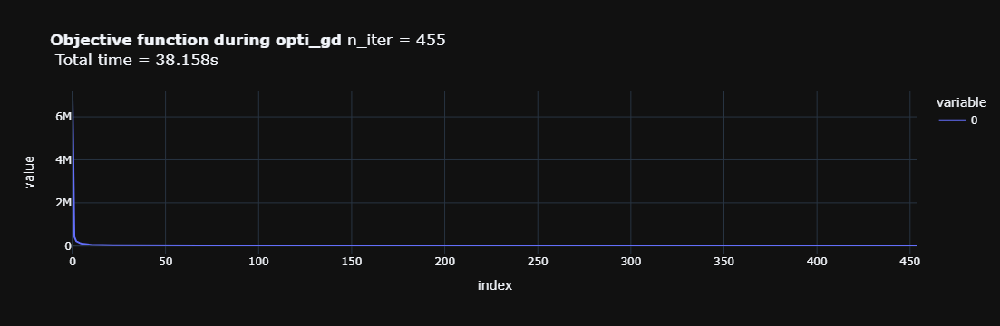

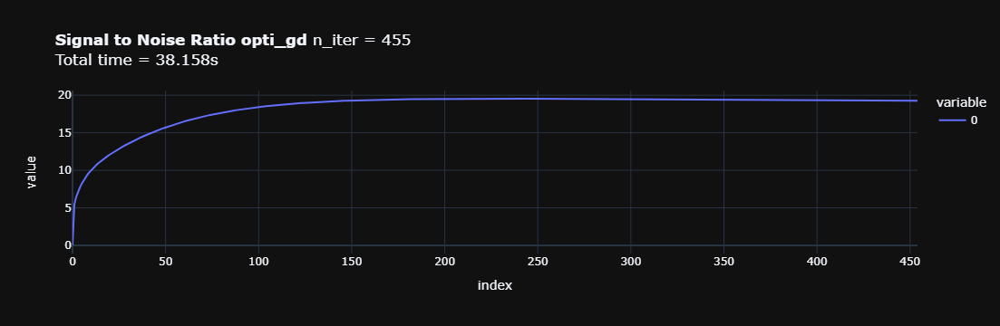

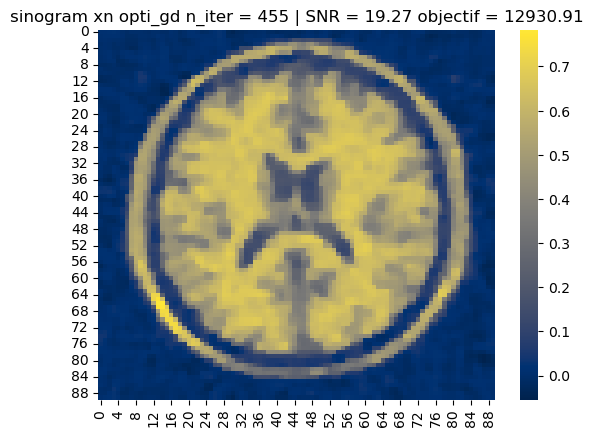

In [160]:
show_results(opti_gd)

On remarque que la décroissance de l'objectif ralentit rapidement, et c'est sur ce point que les algorithmes suivants vont améliorer la situation.

### MM quadratic algorithm

On calcule d'abord la métrique en un point et on implémente l'algorithme MM.

In [73]:
def courbure_A(u, λ = 0.13, δ = 0.02):
    arr = 1 / (δ * np.sqrt(δ ** 2 + (G@u) ** 2  ))
    mat_diag = sparse.diags(arr).tocsc()
    A = lambda v: (H.T@(H@v)) + λ * (G.T@(mat_diag@(G@v)))
    return sparse.linalg.LinearOperator(shape=(H.T@H).shape, matvec=A, rmatvec=A)

print(courbure_A(x)(x))

[2243.68694934 2271.54541847 2299.78965533 ... 2284.72321699 2255.70319475
 2227.31866033]


In [143]:
def opti_quad_mm(θ = 1):
    def update(n,xn,xprev):
        return xn - θ*sparse.linalg.bicg(A=courbure_A(xn), b=grad_f(xn))[0]
    return iterator(update, tqdm_para = 1)




  0%|          | 0/1000 [00:00<?, ?it/s]


  0%|          | 1/1000 [00:11<3:18:26, 11.92s/it]


  0%|          | 2/1000 [00:22<3:09:11, 11.37s/it]


  0%|          | 3/1000 [00:35<3:17:34, 11.89s/it]


  0%|          | 4/1000 [00:46<3:13:39, 11.67s/it]


  0%|          | 5/1000 [00:57<3:06:52, 11.27s/it]


  1%|          | 6/1000 [01:08<3:06:00, 11.23s/it]


  1%|          | 7/1000 [01:19<3:07:07, 11.31s/it]


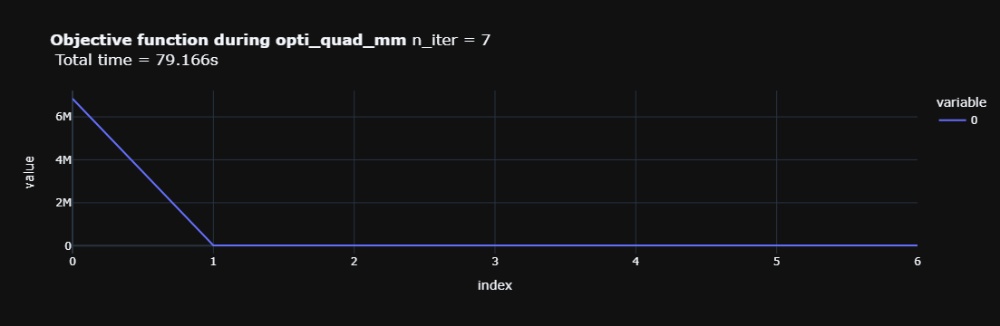

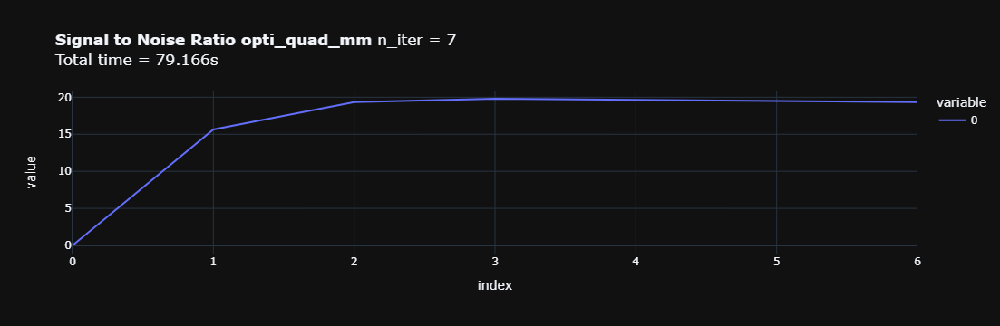

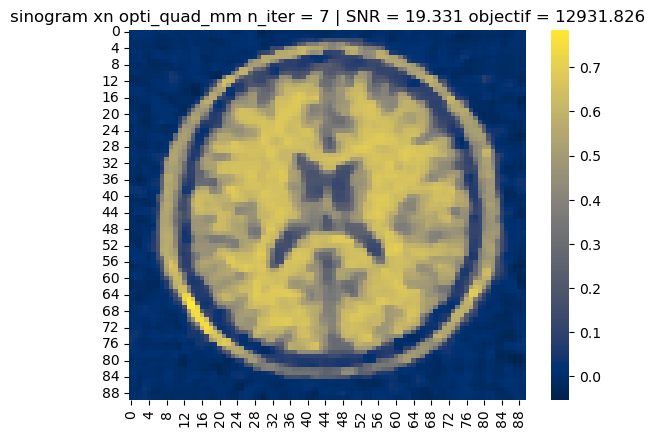

In [161]:
show_results(opti_quad_mm)

Le nombre d'étapes a très fortement réduit le nombre détape, mais la résolution du système linéaire est tellement couteuse que le temps de calcul est au final moins bon. L'idée va être par la suite de résoudre un système linéaire plus petit à chaque étape quitte à augmenter le nombre de step, afin de réduire fortement la taille de la matrice à inverser.

### 3MG 

Dans ce premier cas nous regardons que 2 directions à chaque fois : celui de l'opposée du gradient et la variation de l'état suite à l'étape précédente. En effet, la direction opposée au gradient est on le sait pertient pour réduire l'objectif, et la deuxième direction met en lumière les dimensions les plus importantes dans l'optimisation.

In [1]:
def get_Dk(xn, x_prev=None, first_step=False, λ = 0.13, δ = 0.02):
    if first_step:
        return - grad_f(xn, λ=λ, δ=δ).reshape(-1, 1)
    return np.hstack((-grad_f(xn, λ=λ, δ=δ).reshape(-1, 1), (xn - x_prev).reshape(-1, 1)))

def get_uk(xn, Dn, first_step=False, λ = 0.13, δ = 0.02):
    arr = 1 / (δ * np.sqrt(δ ** 2 + (G@xn) ** 2  ))
    mat_diag = sparse.diags(arr).tocsc()
    HD = H @ Dn
    GD = G @ Dn
    DAD = HD.T @ HD + λ * GD.T @ mat_diag @ GD
    if first_step:
        return - linalg.pinv(DAD) @ (Dn.T @ grad_f(xn, λ=λ, δ=δ).reshape(-1, 1))
    return - linalg.pinv(DAD) @ (Dn.T @ grad_f(xn, λ=λ, δ=δ))

def opti_3mg():
    def update(n,xn,xprev):
        if n==0:
            Dn = get_Dk(xn, x_prev=None, first_step=True)
            un = get_uk(xn, Dn, first_step=True)
        else:
            Dn = get_Dk(xn, x_prev=xprev)
            un = get_uk(xn, Dn)
        # return xn + Dn.dot(un).squeeze()
        return xn + np.squeeze(Dn@un)
    return iterator(update, tqdm_para = 10)

  4%|▍         | 40/1000 [00:01<00:35, 27.30it/s]


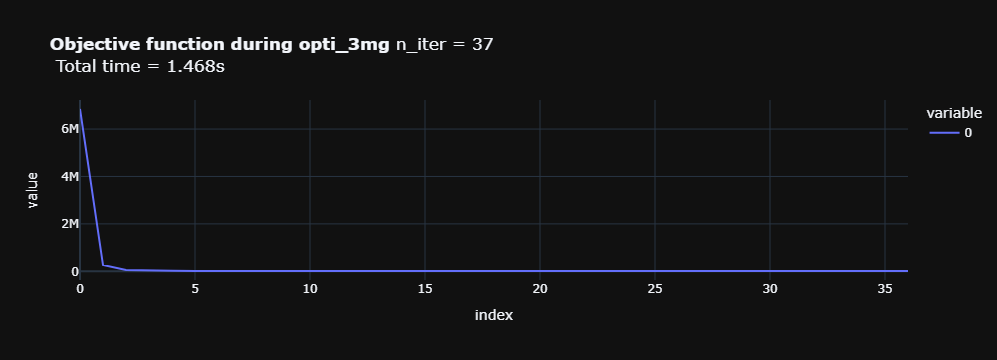

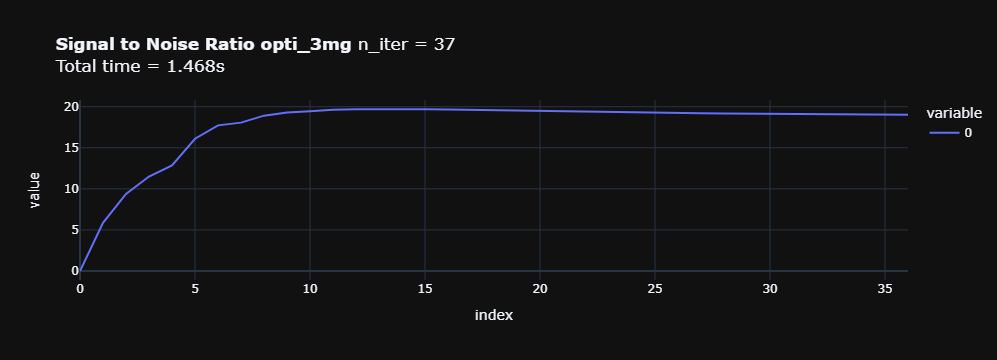

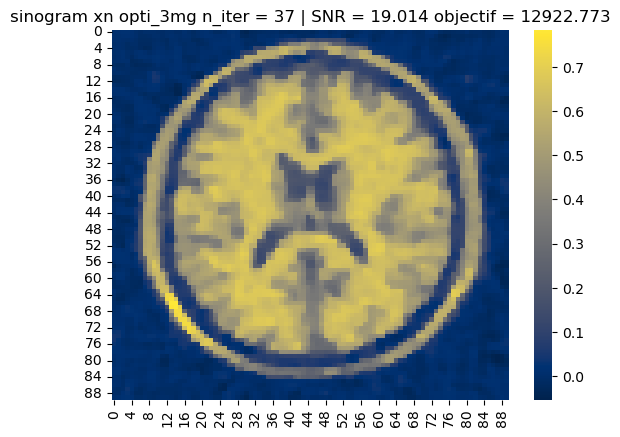

In [19]:
show_results(opti_3mg)

Le résultat est sans appel, cette accélération fonction très bien avec une durée de calcul 40 fois moins longues!

### Block-coordinate MM

L'idée va être maintenant de tirer partie de la sparsité de G et de s'amener à l'inversion de matrice plus petit par l'algorithme quadratique MM par block.

In [171]:
def courbure_Aj(u, j, Nj, λ = 0.13, δ = 0.02):
    subH = H[:, (j - 1) * Nj : j * Nj]
    subG = G[:, (j - 1) * Nj : j * Nj]
    arr = 1 / (δ * np.sqrt(δ ** 2 + (G@u) ** 2  ))
    mat_diag = sparse.diags(arr).tocsc()
    return subH.T@(subH) + λ * (subG.T@(mat_diag@(subG)))

def opti_quadmm_block(θ = 1, K=1):
    Nj = N // K
    def update(n,xn,xprev):
        j = (n%K) + 1
        a,b = (j - 1) * Nj, j * Nj
        xn[a:b] -=  θ*sparse.linalg.bicg(A=courbure_Aj(xn,j, Nj), b=grad_f(xn)[a:b])[0]
        return xn 
    return iterator(update, tqdm_para = 1)


  1%|          | 7/1000 [03:03<7:14:18, 26.24s/it]


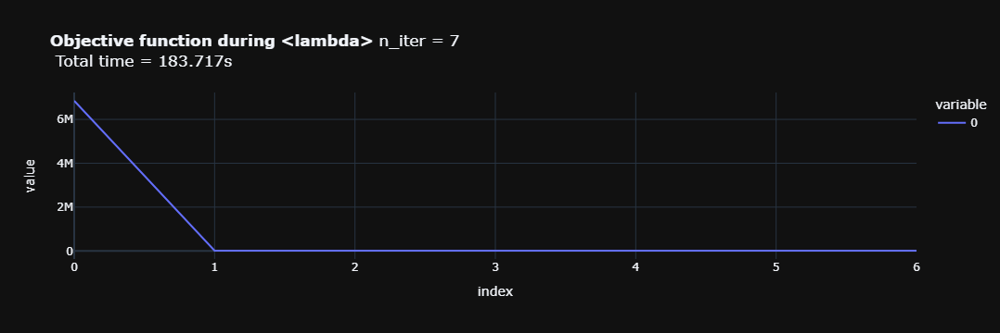

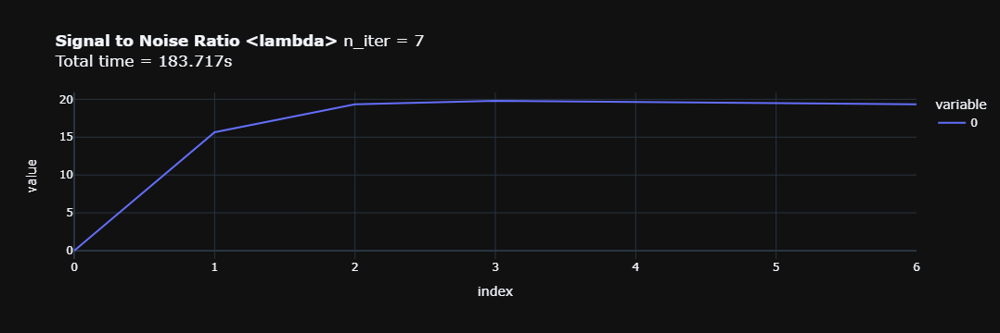

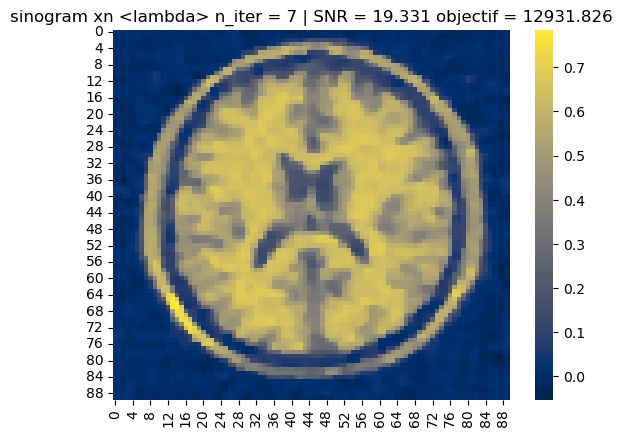


  4%|▎         | 36/1000 [03:45<1:40:46,  6.27s/it]


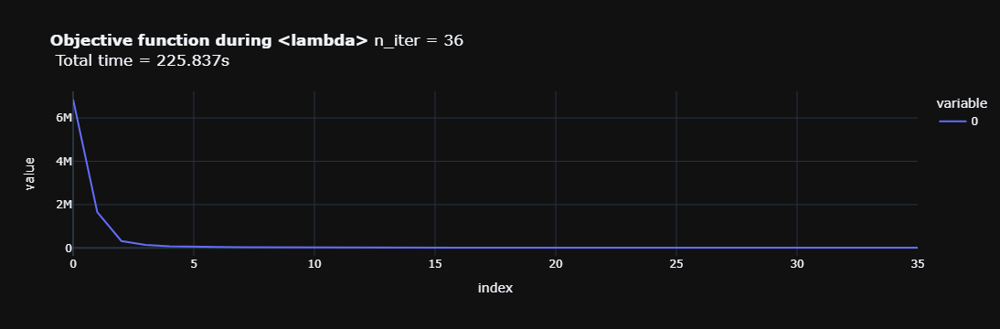

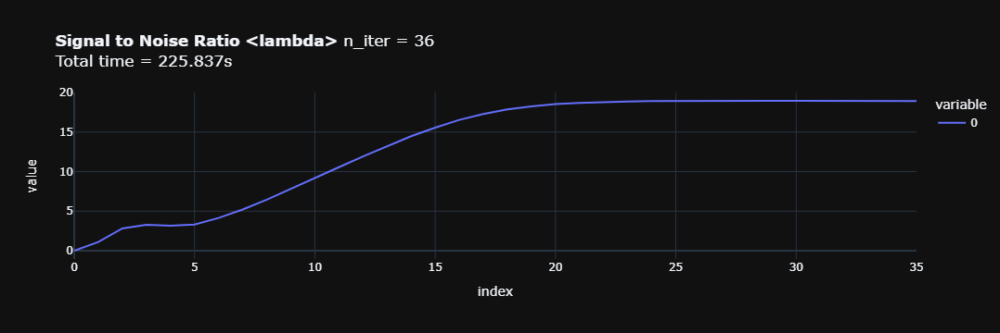

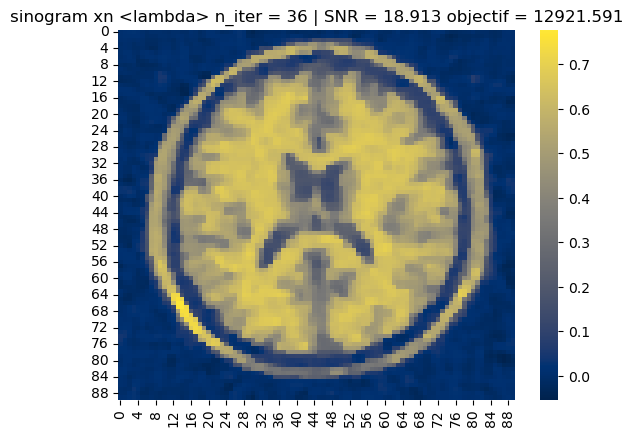


  5%|▍         | 48/1000 [02:14<44:24,  2.80s/it]


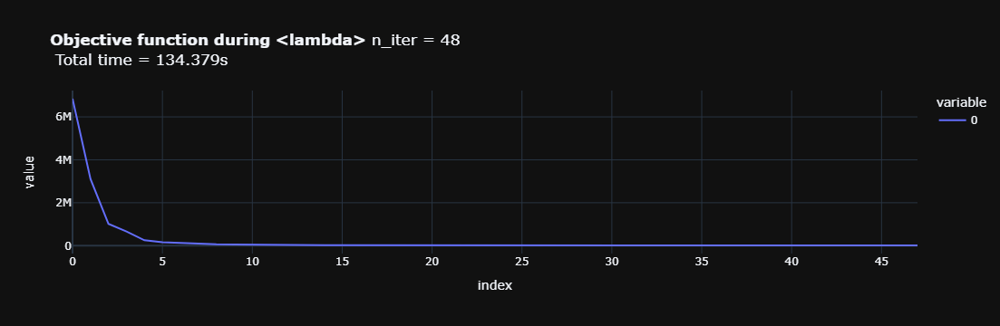

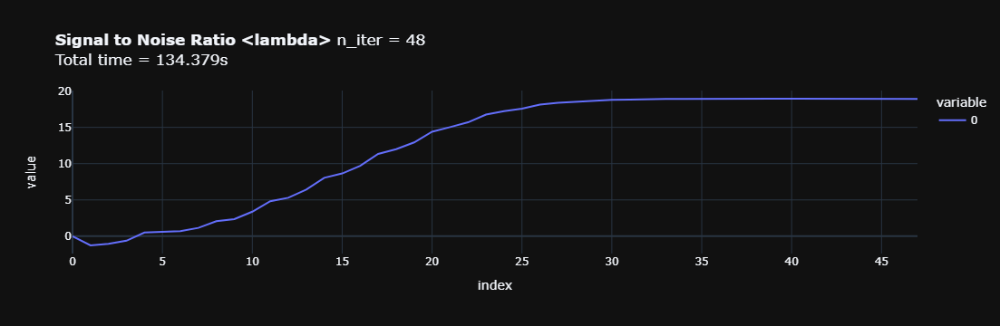

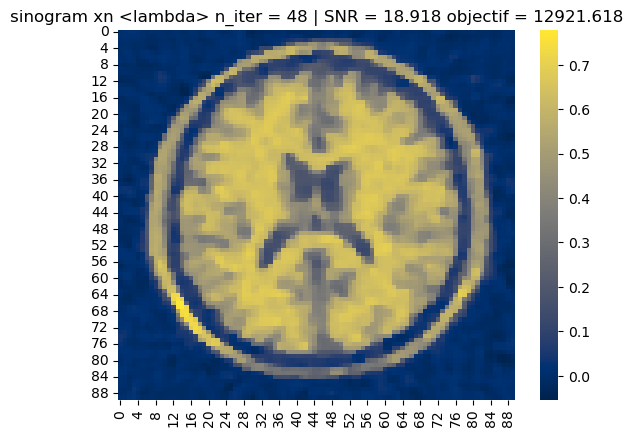


  8%|▊         | 78/1000 [01:30<17:49,  1.16s/it]


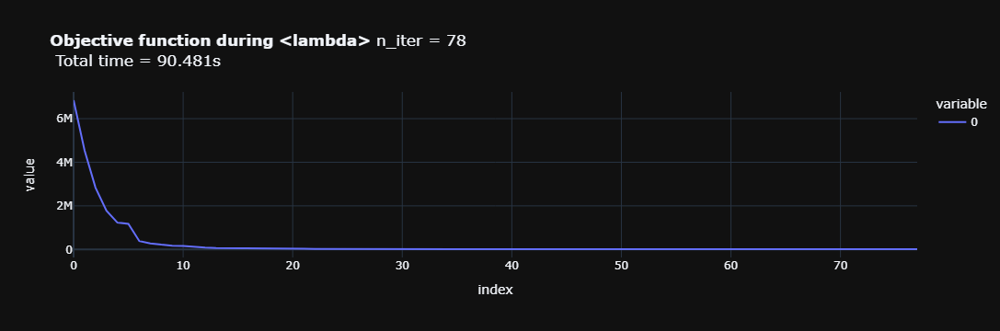

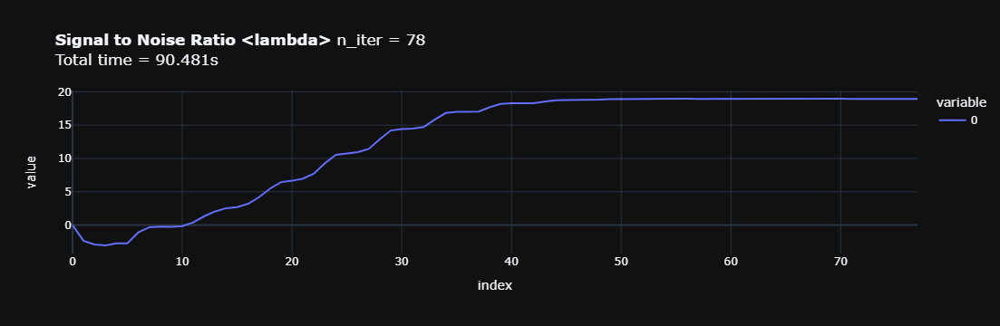

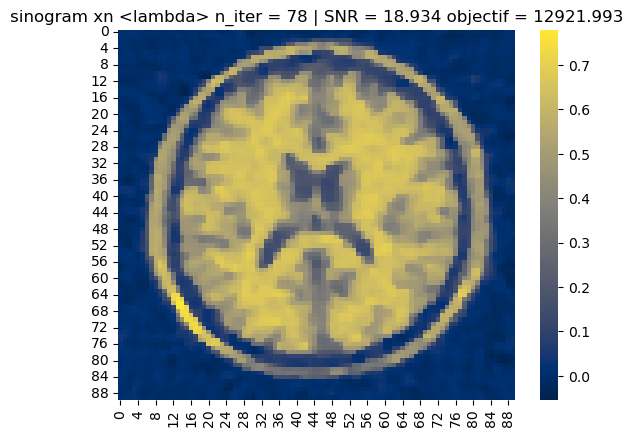


  9%|▉         | 90/1000 [01:18<13:10,  1.15it/s]


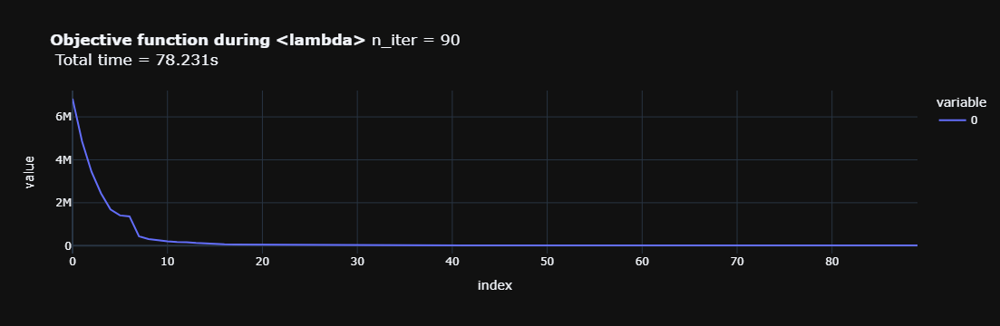

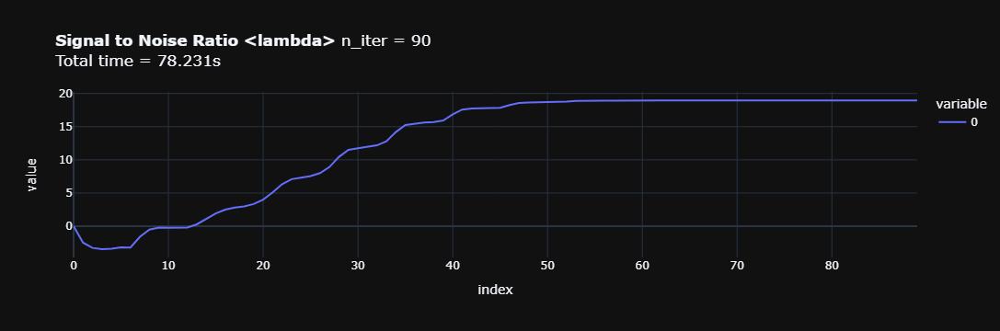

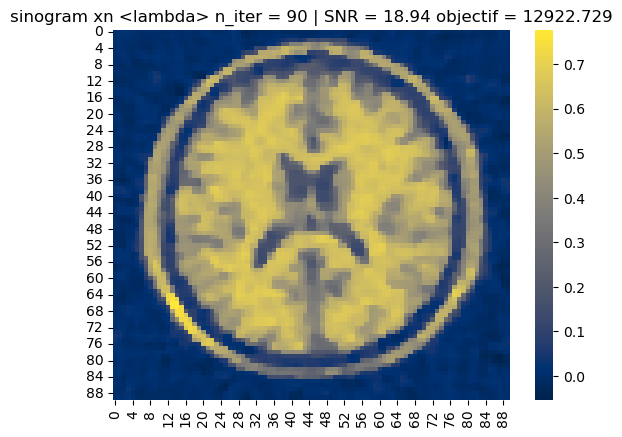


 14%|█▎        | 135/1000 [01:05<06:59,  2.06it/s]


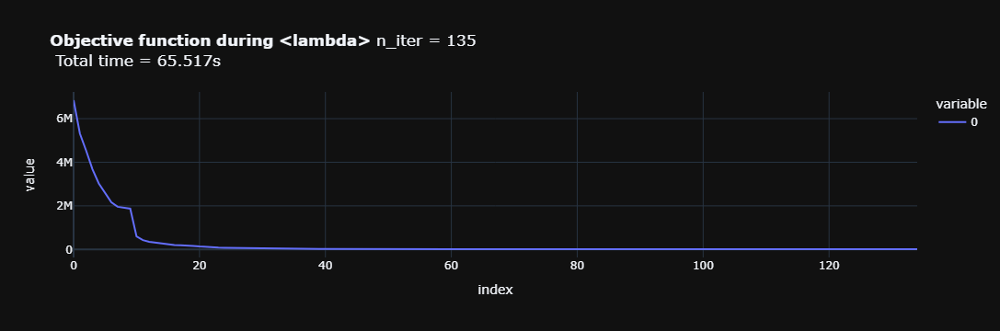

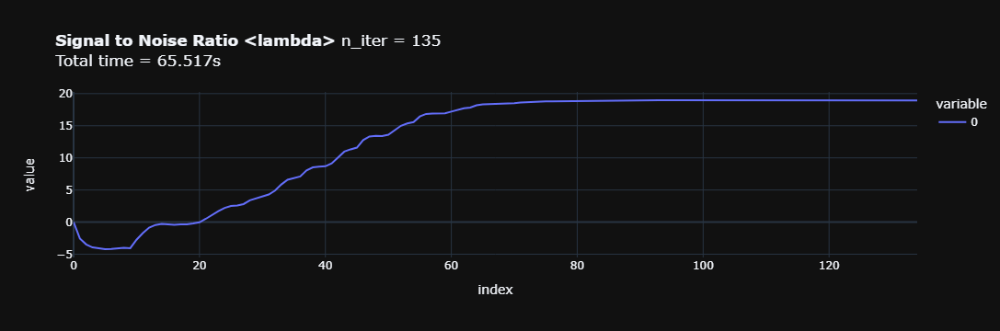

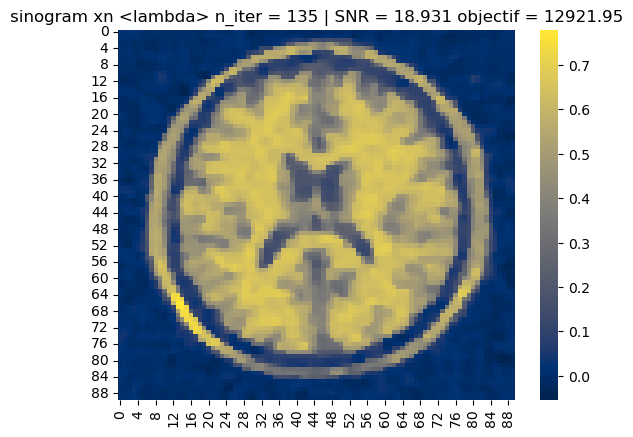

In [173]:
for K in [1,2,3,5,6,9]:
    show_results(lambda : opti_quadmm_block(K=K))

| **K** | **SNR** | **Time (s)** | **n step** |
|:-----:|:-------:|:------------:|------------|
| 1     | 19.3    | 183          | 7          |
| 2     | 18.9    | 225.8        | 36         |
| 3     | 18.9    | 134.4        | 48         |
| 5     | 18.9    | 90.4         | 78         |
| 6     | 18.9    | 78.2         | 90         |
| 9     | 18.9    | 65.5         | 135        |

On remarque que la relation entre le nombre de blocks et la durée de convergence n'est pas triviale, et met en lumière un compromis entre vitesse de résolution du système linéaire et nombre de mise à jours. Le nombre de block optimal est ici **9**. Aussi la forme en escalier du SNR témoigne d'une différence dans l'influence sur l'objectif des dimensions, ce qui justifie encore une fois le fait de se concentrer sur des directions particulières comme dans le 3MG.

### Parallel MM quadratic algorithm

Enfin une dernière idée d'algorithme est de tirer partie d'une distribution du calcul avec le Parallel MM.

In [7]:
def bi(u, λ = 0.13, δ = 0.02):
    arr = 1 / (δ * np.sqrt(δ ** 2 + (G@u) ** 2  ))
    mat_diag = sparse.diags(arr).tocsc()
    return sparse.linalg.norm(H.T@H, ord=1) + λ * sparse.linalg.norm(G.T@mat_diag@G, ord=1)

print(bi(x))

20781.198552648482


In [10]:
def opti_quadmm_parallel(θ = 1):
    def update(n,xn,xprev):
        return xn - (θ/bi(xn))*grad_f(xn)
    return iterator(update, tqdm_para = 5)

 52%|█████▎    | 525/1000 [56:42<51:18,  6.48s/it]  


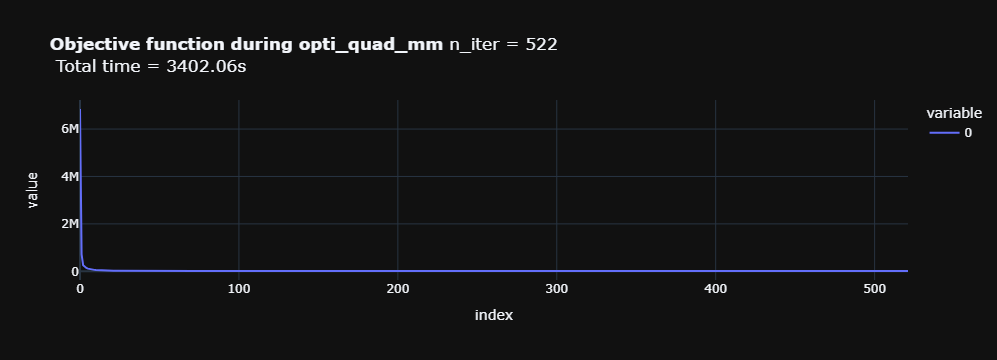

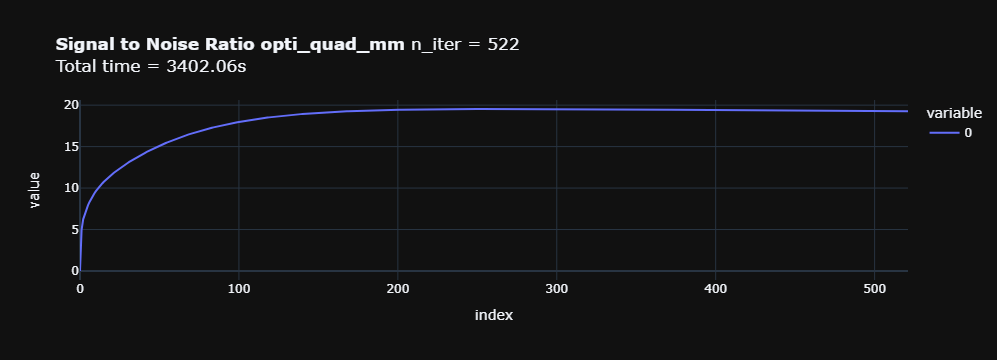

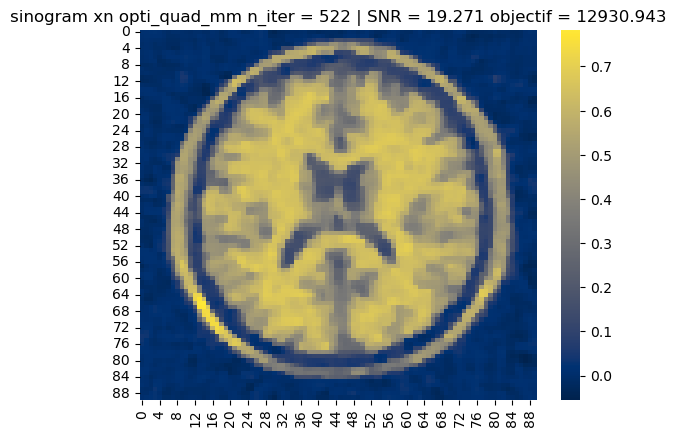

In [18]:
show_results(opti_quad_mm)

Comme on s'y attend l'algorithme est moins efficace que le gradient dont le pas n'est pas couteux en terme de calcul. Le fait que le pas soit homogène en toutes les dimensions fait perdre tout l'intérêt de la méthode MM comparé à une descente de gradient simple.
En somme, cette parallélistion est trop grossière et ainsi contre productive.

## Comparison of the methods

|      **algorithm**      | **SNR** | **Time (s)** | **n step** |
|:-----------------------:|:-------:|:------------:|------------|
| Gradient descent        | 19.3    | 38.1         | 455        |
| MM quadratic            | 19.3    | 79.1         | 7          |
| **3MG**                 | 18.9    | 1.5          | 37         |
| Block-coordinate MM K=9 | 18.9    | 65.5         | 135        |
| MM quadratic parallel   | 19.2    | 3402         | 522        |

L'algorithme 3MG est celui qui a le meilleur compromis entre le coût d'accès à une information supplémentaire au gradient, comme la courbure et le gain que cela apporte en terme de nombre d'étapes. Il faut cependant souligner que la majoration avec A n'est issue que de la forme de l'objectif.